In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import matplotlib.cm as cm
import folium as folium
from folium.plugins import HeatMap,HeatMapWithTime
import pgeocode

# Change settings to display all columns
pd.options.display.max_columns = None

# Create color map
cm = sns.light_palette("green", as_cmap=True)

## Load Data

In [2]:
# Load data
labeled = pd.read_csv("neighborhood.csv", low_memory=False)

In [3]:
labeled.head(5)

,Unnamed: 0,label_1,label_2,latitude,longitude,POP901,POP902,POP903,POP90C1,AGE901,AGE903,AGE904,HHAGE1,HHP2,HV2,HU1,HU2,HU3,HU4,HU5,IC3,IC4,IC5,HHAS1,HHAS2,HHAS3,HHAS4,LFC4,LFC5,EC1,EC3,AFC1,AFC2,AFC3,AFC4,AFC5,AFC6
0,0,Active,Label fans,41.8055,-89.7054,992,264,332,0,39,51,40,26,276,635,86,14,96,4,7,349,378,12883,28,4,51,1,64,44,120,10,0,0,0,18,39,0
1,1,Casual,Calendar fans,34.2619,-118.5820,3611,940,998,99,34,43,32,12,360,5218,96,4,97,3,9,1026,1037,36175,6,2,66,3,81,57,160,5,0,0,0,8,15,0
2,2,Active,No preference,36.3698,-80.7101,7001,2040,2669,0,35,46,37,25,254,546,78,22,93,7,18,292,340,11576,28,8,31,11,70,56,120,20,0,0,0,10,21,0
3,3,Active,Notepad fans,39.2601,-121.6923,640,160,219,0,32,44,34,25,283,1263,48,52,93,7,6,396,423,15130,22,14,26,20,68,45,120,12,0,0,0,13,23,0
4,4,Casual,Label fans,34.5484,-87.0004,18172,5112,6618,81,32,41,33,14,265,899,70,30,93,7,4,406,454,15619,19,3,40,8,77,50,120,14,0,0,0,13,27,1


## Chosen variables

## First partition map

In [5]:
## Will create a map to represent each cluster combination seperately
# using first partition labels [data after RFM]


#initialize the map
first_partition_map = folium.Map(location=[38, -102],zoom_start = 4) 

# Ensure it's floats
labeled['latitude'] = labeled['latitude'].astype(float)
labeled['longitude'] = labeled['longitude'].astype(float)

# create time series based on label values

heat0_df = labeled.sort_values('label_1',ascending=True)
tdata = []
for _, d in heat0_df.groupby(['label_1']):
    tdata.append([[row['latitude'], row['longitude'], row['label_1']] for _, row in d.iterrows()])
# load a plugin
hm = HeatMapWithTime(tdata, auto_play=True,max_opacity=0.2)
hm.add_to(first_partition_map)

# export
first_partition_map.save("first_partition_map.html")

# Display the map
first_partition_map

## Second partition map

In [6]:
# shall create a map to represent each cluster after second partition despite RFM analysis

#initialize
second_partition_map = folium.Map(location=[38, -102],zoom_start = 4)  

# Ensure it's floats
labeled['latitude'] = labeled['latitude'].astype(float)
labeled['longitude'] = labeled['longitude'].astype(float)

# create time series based on label values

heat0_df = labeled.sort_values('label_2',ascending=True)
tdata = []
for _, d in heat0_df.groupby(['label_2']):
    tdata.append([[row['latitude'], row['longitude'], row['label_2']] for _, row in d.iterrows()])
# load a plugin
hm = HeatMapWithTime(tdata, auto_play=True,max_opacity=0.2)
hm.add_to(second_partition_map)

# export
second_partition_map.save("second_partition_map.html")

# Display the map
second_partition_map

## Final map after creating a dendrogram

In [7]:
# cheking the results after creating the histogram
# shall create a map to represent each cluster combination seperately (3x6)

#initialize
cluster_map = folium.Map(location=[38, -102],zoom_start = 4) 

# Ensure it's floats
labeled['latitude'] = labeled['latitude'].astype(float)
labeled['longitude'] = labeled['longitude'].astype(float)

# create time series based on label values

heat0_df = labeled.sort_values('label_1',ascending=True)
tdata = []
for _, d in heat0_df.groupby(['label_1','label_2']):
    tdata.append([[row['latitude'], row['longitude'], row['label_2']] for _, row in d.iterrows()])
# load a plugin
hm = HeatMapWithTime(tdata, auto_play=True,max_opacity=0.2)
hm.add_to(cluster_map)

# export
cluster_map.save("Final_cluster_map.html")

# Display the map
cluster_map

In [8]:
neighborhood.remove('latitude')
neighborhood.remove('longitude')

In [9]:
# we can see that some clusters are really small, but still spread out

#### Will inspect the neghborhood data in terms of:  


- Number of Persons 
- Median Age of Adults   
- Percent Households w/ Person 65+  
- Average Home Value in hundreds 
- Income  
- Percent Adults in Active Military Service  

In [ ]:
neighborhood = ['latitude','longitude', 'POP901','POP902','POP903','POP90C1',
                'AGE901','AGE903','AGE904','HHAGE1',
                'HHP2','HV2','HU1','HU2','HU3','HU4','HU5',
                'IC3','IC4','IC5',
                'HHAS1','HHAS2','HHAS3','HHAS4',
                'LFC4','LFC5',
                'EC1','EC3',
                'AFC1','AFC2','AFC3','AFC4','AFC5','AFC6']

# Neighborhood police

In [10]:
def statistics(variable):
    if variable.dtypes == "int64" or variable.dtype == "float64":
        return pd.DataFrame([[variable.name, np.mean(variable), np.std(variable), np.median(variable), np.var(variable)]], 
                            columns = ["Variable", "Mean", "Standard Deviation", "Median", "Variance"]).set_index("Variable")
    else:
        return pd.DataFrame(variable.value_counts())
def graph_histo(x):
    if x.dtype == "int64" or x.dtype == "float64":
        # Select size of bins by getting maximum and minimum and divide the substraction by 10
        size_bins = 10
        # Get the title by getting the name of the column
        title = "Distribution plot"
        #Assign random colors to each graph
        color_kde = list(map(float, np.random.rand(3,)))
        color_bar = list(map(float, np.random.rand(3,)))

        # Plot the displot
        sns.distplot(x, bins=size_bins, kde_kws={"lw": 1.5, "alpha":0.8, "color":color_kde},
                       hist_kws={"linewidth": 1.5, "edgecolor": "grey",
                                "alpha": 0.4, "color":color_bar})
        # Customize ticks and labels
        plt.xticks(size=14)
        plt.yticks(size=14);
        plt.ylabel("Frequency", size=16, labelpad=15);
        # Customize title
        plt.title(title, size=18)
        # Customize grid and axes visibility
        plt.grid(False);
        plt.gca().spines["top"].set_visible(False);
        plt.gca().spines["right"].set_visible(False);
        plt.gca().spines["bottom"].set_visible(False);
        plt.gca().spines["left"].set_visible(False);   
    else:
        x = pd.DataFrame(x)
        # Plot       
        sns.catplot(x=x.columns[0], kind="count", palette="spring", data=x)
        # Customize title
        title = x.columns[0]
        plt.title(title, size=18)
        # Customize ticks and labels
        plt.xticks(size=14)
        plt.yticks(size=14);
        plt.xlabel("")
        plt.ylabel("Counts", size=16, labelpad=15);        
        # Customize grid and axes visibility
        plt.gca().spines["top"].set_visible(False);
        plt.gca().spines["right"].set_visible(False);
        plt.gca().spines["bottom"].set_visible(False);
        plt.gca().spines["left"].set_visible(False);

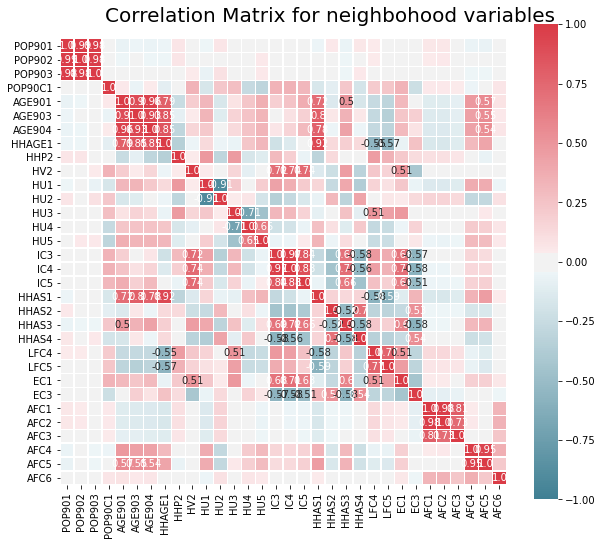

In [11]:

# Prepare figure
fig = plt.figure(figsize=(10, 8))

# Obtain correlation matrix. Round the values to 2 decimal cases. Use the DataFrame corr() and round() method.
corr = np.round(labeled[neighborhood].corr(method="pearson"), decimals=2)

# Build annotation matrix (values above |0.5| will appear annotated in the plot)
mask_annot = np.absolute(corr.values) >= 0.5
annot = np.where(mask_annot, corr.values, np.full(corr.shape,"")) # Try to understand what this np.where() does

# Plot heatmap of the correlation matrix
sns.heatmap(data=corr, annot=annot, cmap=sns.diverging_palette(220, 10, as_cmap=True), 
            fmt='s', vmin=-1, vmax=1, center=0, square=True, linewidths=.5)

# Layout
fig.subplots_adjust(top=0.95)
fig.suptitle("Correlation Matrix for neighbohood variables", fontsize=20)

plt.show()

In [12]:
# will inspect the correlated areas and look for significance

In [13]:
clust_0 = pd.DataFrame(labeled[labeled['label_1']== 'Casual'])
clust_1 = pd.DataFrame(labeled[labeled['label_1']== 'Loyal'])
clust_2 = pd.DataFrame(labeled[labeled['label_1']== 'Active'])

In [14]:
#statistics(clust_1['EC3'])
statistics(clust_0['EC3'])

,Mean,Standard Deviation,Median,Variance
Variable,,,,
EC3,12.709149,7.760158,12.0,60.220052


In [15]:
statistics(clust_2['EC3'])

,Mean,Standard Deviation,Median,Variance
Variable,,,,
EC3,13.191979,7.44942,13.0,55.493856


In [16]:
statistics(clust_1['EC3'])

,Mean,Standard Deviation,Median,Variance
Variable,,,,
EC3,12.89191,7.474795,12.0,55.87256


#### Insignificant results lead to a decission to use only the selected variables from the list below

In [17]:
#will split and inspect separately

#hh_age_dif = ['AGE901','AGE903','AGE904','HHAGE1']
#hood_income = ['IC3','IC4','IC5']
#social_needs =['HHAS1','HHAS2','HHAS3','HHAS4']
# 'EC3' Percent Adults 25+ w/ some High School
#military_hood = ['AFC1','AFC2','AFC3','AFC4','AFC5','AFC6']



# 'EC3' Percent Adults 25+ w/ some High School

In [18]:
#will only be using pre-selected variables :

#AGE904 Average Age of Population
#IC3   Average Household Income in hundreds
#HHAS3 Percent Households w/ Interest, Rental or Dividend Income
#AFC4   Percent Adult Veterans Age 16+
#EC3 Percent Adults 25+ w/ some High School

In [19]:
clust_0 = clust_0.rename(columns={'AGE904': 'Average_Age', 'IC3': 'Avg_HH_Income', 'HHAS3':'Rental_or_Dividend_Income' ,
                        'AFC4':'Adult_Veterans','EC3':'Hood_Education_lvl'
                       })
clust_1 = clust_1.rename(columns={'AGE904': 'Average_Age', 'IC3': 'Avg_HH_Income', 'HHAS3':'Rental_or_Dividend_Income' ,
                        'AFC4':'Adult_Veterans','EC3':'Hood_Education_lvl'
                       })
clust_2 = clust_2.rename(columns={'AGE904': 'Average_Age', 'IC3': 'Avg_HH_Income', 'HHAS3':'Rental_or_Dividend_Income' ,
                        'AFC4':'Adult_Veterans','EC3':'Hood_Education_lvl'
                       })
hoodie =['Average_Age','Avg_HH_Income','Rental_or_Dividend_Income','Adult_Veterans','Hood_Education_lvl']

In [20]:
# will inspect if there's any difference in distribution when it comes to age

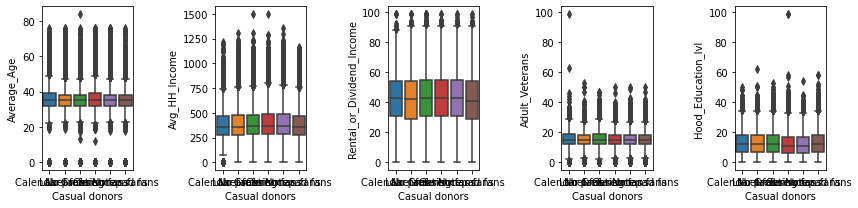

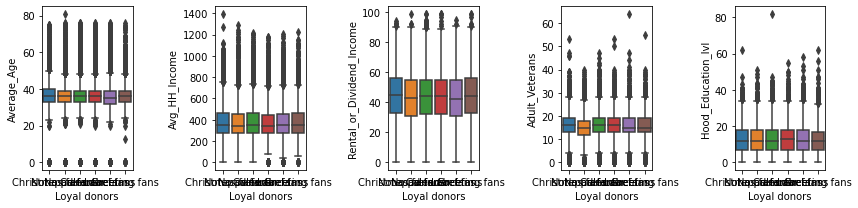

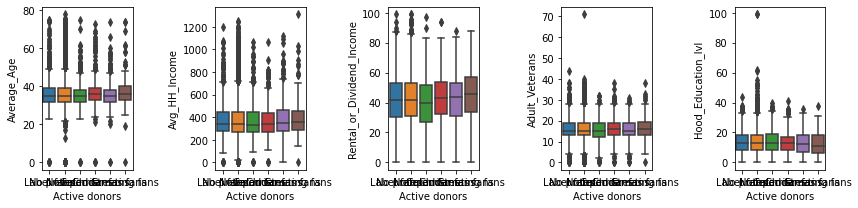

In [21]:
f, axes = plt.subplots(1, 5, figsize=(12,3))

for i in range(len(hoodie)):
    sns.boxplot(y=hoodie[i], x="label_2", data=clust_0[hoodie+["label_2"]], ax=axes[i]).set(xlabel='Casual donors')

plt.tight_layout()


f, axes = plt.subplots(1, 5, figsize=(12,3))

for i in range(len(hoodie)):
    sns.boxplot(y=hoodie[i], x="label_2", data=clust_1[hoodie+["label_2"]], ax=axes[i]).set(xlabel='Loyal donors')
plt.tight_layout()    
f, axes = plt.subplots(1, 5, figsize=(12,3))

for i in range(len(hoodie)):
    sns.boxplot(y=hoodie[i], x="label_2", data=clust_2[hoodie+["label_2"]], ax=axes[i]).set(xlabel='Active donors')
plt.tight_layout()

In [22]:
# check male vs female employment in hood
statistics(labeled['LFC4'])

,Mean,Standard Deviation,Median,Variance
Variable,,,,
LFC4,69.828224,14.97937,72.0,224.381521


In [23]:
statistics(labeled['LFC5'])

,Mean,Standard Deviation,Median,Variance
Variable,,,,
LFC5,52.986813,13.738895,54.0,188.757225


In [24]:
labeled = labeled.rename(columns={'LFC4': 'Adult_Males_Employed', 'LFC5': 'Adult_Females_Employed'})

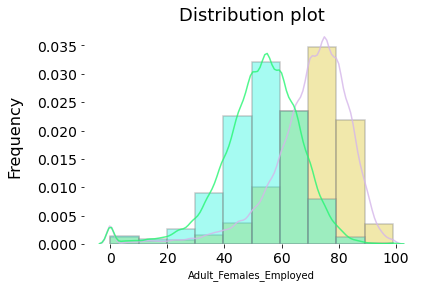

In [25]:
graph_histo(labeled['Adult_Males_Employed'])
graph_histo(labeled['Adult_Females_Employed'])